In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

In [ ]:
df = pd.read_csv("Darknet.csv", delimiter=',', on_bad_lines='skip')

df['Timestamp'] = pd.to_datetime(df['Timestamp'], format='%d/%m/%Y %I:%M:%S %p')
df['Date'] = df['Timestamp'].dt.date

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Total Fwd Packet,Total Bwd packets,...,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,Label.1,Date
0,10.152.152.11-216.58.220.99-57158-443-6,10.152.152.11,57158,216.58.220.99,443,6,2015-07-24 16:09:48,229,1,1,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,Non-Tor,AUDIO-STREAMING,2015-07-24
1,10.152.152.11-216.58.220.99-57159-443-6,10.152.152.11,57159,216.58.220.99,443,6,2015-07-24 16:09:48,407,1,1,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,Non-Tor,AUDIO-STREAMING,2015-07-24
2,10.152.152.11-216.58.220.99-57160-443-6,10.152.152.11,57160,216.58.220.99,443,6,2015-07-24 16:09:48,431,1,1,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,Non-Tor,AUDIO-STREAMING,2015-07-24
3,10.152.152.11-74.125.136.120-49134-443-6,10.152.152.11,49134,74.125.136.120,443,6,2015-07-24 16:09:48,359,1,1,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,Non-Tor,AUDIO-STREAMING,2015-07-24
4,10.152.152.11-173.194.65.127-34697-19305-6,10.152.152.11,34697,173.194.65.127,19305,6,2015-07-24 16:09:45,10778451,591,400,...,0,0,0,1.437765e+15,3.117718e+06,1.437765e+15,1.437765e+15,Non-Tor,AUDIO-STREAMING,2015-07-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141525,10.8.8.246-224.0.0.252-55219-5355-17,10.8.8.246,55219,224.0.0.252,5355,17,2015-05-22 13:55:03,411806,2,0,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,VPN,VOIP,2015-05-22
141526,10.8.8.246-224.0.0.252-64207-5355-17,10.8.8.246,64207,224.0.0.252,5355,17,2015-05-22 14:09:05,411574,2,0,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,VPN,VOIP,2015-05-22
141527,10.8.8.246-224.0.0.252-61115-5355-17,10.8.8.246,61115,224.0.0.252,5355,17,2015-05-22 14:19:31,422299,2,0,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,VPN,VOIP,2015-05-22
141528,10.8.8.246-224.0.0.252-64790-5355-17,10.8.8.246,64790,224.0.0.252,5355,17,2015-05-22 14:29:55,411855,2,0,...,0,0,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,VPN,VOIP,2015-05-22


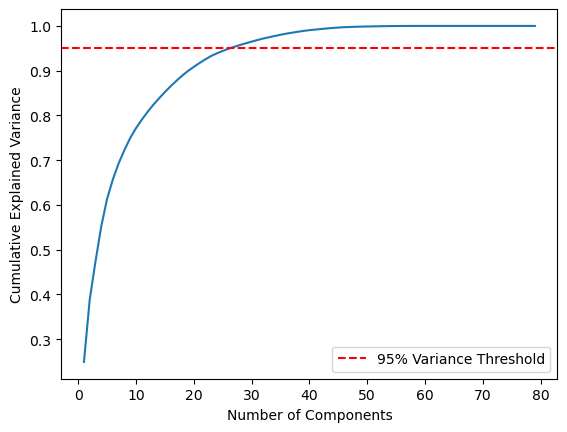

In [ ]:
df_filtered = df[df["Label"].isin(['Non-Tor', 'NonVPN', 'VPN', 'Tor'])]


X = df_filtered.select_dtypes(include=['number'])

X.replace([np.inf, -np.inf], np.nan, inplace=True) 
X.dropna(inplace=True)  
X = X.clip(lower=-1e6, upper=1e6) 


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


pca = PCA()
pca.fit(X_scaled) #X_scaled is the scaled data
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance Threshold')
plt.legend()
plt.show()


In [7]:

n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1  

print(f"Optimal number of components for 95% variance: {n_components_95}")


Optimal number of components for 95% variance: 27


In [7]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Filter only the relevant labels
df_filtered = df[df["Label"].isin(['Non-Tor', 'NonVPN', 'VPN', 'Tor'])]

# Select only numerical features for PCA
X = df_filtered.select_dtypes(include=['number'])

# Handle missing or infinite values:
X.replace([np.inf, -np.inf], np.nan, inplace=True)  # Convert infinities to NaN
X.dropna(inplace=True)  # Remove rows with NaN values
X = X.clip(lower=-1e6, upper=1e6)  # Clip extreme values

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform PCA
pca = PCA(n_components=3)
components = pca.fit_transform(X_scaled)

# Compute total explained variance
total_var = pca.explained_variance_ratio_.sum() * 100

# Convert PCA result into a DataFrame
df_pca = pd.DataFrame(components, columns=['PC1', 'PC2', 'PC3'])
df_pca['Label'] = df_filtered.iloc[X.index]['Label']  # Add labels back for coloring

# Create interactive 3D PCA scatter plot
fig = px.scatter_3d(
    df_pca, x='PC1', y='PC2', z='PC3', color='Label',
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'}
)

fig.update_layout(
    title=f'Total Explained Variance: {total_var:.2f}%',
    scene=dict(
        xaxis_title="PC1",
        yaxis_title="PC2",
        zaxis_title="PC3"
    ),
    width=1000,  # Larger width
    height=700   # Larger height
)
# Show the figure
fig.show()




In [ ]:
df['Month-Year'] = df['Timestamp'].dt.to_period('M')

df['Date'] = df['Timestamp'].dt.date

days_per_month = df.groupby('Month-Year')['Date'].nunique()

print(days_per_month)



Month-Year
2015-03    2
2015-04    4
2015-05    5
2015-06    4
2015-07    9
2016-02    3
Freq: M, Name: Date, dtype: int64


In [3]:
df['Month-Year'] = df['Timestamp'].dt.to_period('M')
month_counts = df['Month-Year'].value_counts().sort_index()
print(month_counts)


2015-03     5155
2015-04    20360
2015-05    13201
2015-06     8261
2015-07    15421
2016-02    79132
Freq: M, Name: Month-Year, dtype: int64


In [ ]:
df['Month-Year'] = df['Timestamp'].dt.to_period('M') 
unique_months = df['Month-Year'].unique()
print(unique_months)


<PeriodArray>
['2015-07', '2016-02', '2015-04', '2015-05', '2015-06', '2015-03']
Length: 6, dtype: period[M]


March,april.may,June,July 2025
February 2016

In [4]:
max_year = df['Timestamp'].dt.year.min()
print(max_year)

2015


In [6]:
df["Label"].value_counts()


Non-Tor    93356
NonVPN     23863
VPN        22919
Tor         1392
Name: Label, dtype: int64

In [7]:
df["Label.1"].value_counts()

P2P                48520
Browsing           32808
Audio-Streaming    16580
Chat               11478
File-Transfer      11098
Video-Streaming     9486
Email               6145
VOIP                3566
AUDIO-STREAMING     1484
Video-streaming      281
File-transfer         84
Name: Label.1, dtype: int64

In [17]:
# Ensure Month-Year and Date are extracted
df['Month-Year'] = df['Timestamp'].dt.to_period('M')
df['Label.1'] = df['Label.1'].str.lower()

# Get all possible combinations of Month-Year and (Label, Label.1)
all_combinations = df.groupby(['Month-Year', 'Label', 'Label.1']).size().reset_index(name='Count')

# Pivot to check presence across months
presence_matrix = all_combinations.pivot_table(index=['Label'], 
                                               columns='Month-Year', 
                                               values='Count', 
                                               aggfunc='count', 
                                               fill_value=0)

print(presence_matrix)


Month-Year  2015-03  2015-04  2015-05  2015-06  2015-07  2016-02
Label                                                           
Non-Tor           0        0        0        0        6        3
NonVPN            3        5        3        1        0        0
Tor               0        4        0        0        7        4
VPN               0        1        4        4        0        0


In [15]:
df['Month-Year'] = df['Timestamp'].dt.to_period('M')
df['Date'] = df['Timestamp'].dt.date
df['Label.1'] = df['Label.1'].str.lower()

# Group by Month-Year, Date, Label, and Label.1 and count occurrences
df_combined = df.groupby(['Month-Year', 'Date', 'Label', 'Label.1']).size().reset_index(name='Count')

df_combined.tail(30)

,Month-Year,Date,Label,Label.1,Count
36,2015-07,2015-07-15,Non-Tor,video-streaming,1953
37,2015-07,2015-07-15,Tor,video-streaming,75
38,2015-07,2015-07-17,Non-Tor,file-transfer,2435
39,2015-07,2015-07-17,Non-Tor,video-streaming,1429
40,2015-07,2015-07-17,Tor,file-transfer,68
41,2015-07,2015-07-17,Tor,video-streaming,30
42,2015-07,2015-07-21,Tor,audio-streaming,18
43,2015-07,2015-07-22,Non-Tor,chat,100
44,2015-07,2015-07-22,Tor,chat,28
45,2015-07,2015-07-24,Non-Tor,audio-streaming,1156


In [5]:
df['Month-Year'] = df['Timestamp'].dt.to_period('M')
df['Label.1'] = df['Label.1'].str.lower()

df_combined = df.groupby(['Month-Year', 'Label', 'Label.1']).size().reset_index(name='Count')
print(df_combined)

   Month-Year    Label          Label.1  Count
0     2015-03   NonVPN  audio-streaming   2759
1     2015-03   NonVPN    file-transfer    155
2     2015-03   NonVPN  video-streaming   2241
3     2015-04   NonVPN  audio-streaming    537
4     2015-04   NonVPN             chat   1775
5     2015-04   NonVPN    file-transfer    325
6     2015-04   NonVPN  video-streaming   2798
7     2015-04   NonVPN             voip   2101
8     2015-04      Tor         browsing     16
9     2015-04      Tor             chat      9
10    2015-04      Tor  video-streaming     97
11    2015-04      Tor             voip     73
12    2015-04      VPN  audio-streaming  12629
13    2015-05   NonVPN             chat   4749
14    2015-05   NonVPN            email   4120
15    2015-05   NonVPN    file-transfer   1352
16    2015-05      VPN  audio-streaming    361
17    2015-05      VPN    file-transfer    308
18    2015-05      VPN  video-streaming   1144
19    2015-05      VPN             voip   1167
20    2015-06

In [19]:
df['Label.1'] = df['Label.1'].str.lower()  
df_combined = df.groupby(['Label', 'Label.1']).size().reset_index(name='Count')
df_combined

,Label,Label.1,Count
0,Non-Tor,audio-streaming,1484
1,Non-Tor,browsing,32545
2,Non-Tor,chat,413
3,Non-Tor,email,492
4,Non-Tor,file-transfer,6740
5,Non-Tor,p2p,48300
6,Non-Tor,video-streaming,3382
7,NonVPN,audio-streaming,3296
8,NonVPN,chat,6524
9,NonVPN,email,5071
